In [1]:
import matplotlib
# matplotlib.use('Agg')


from astropy.io import fits
import glob
import os
import sys
import time 
import h5py
import numpy as np
import pandas as pd 
import subprocess
import pyproj

from scipy import interpolate

import matplotlib.pyplot as plt 
# plt.ioff() 

import astropy
from astropy.io import fits
from astropy.wcs import WCS

import astropy.units as u
from astropy.time import Time
from astropy.wcs.utils import skycoord_to_pixel
from astropy.coordinates import EarthLocation, AltAz, GCRS, ITRS, Angle, SkyCoord, FK5
from astropy.visualization import ZScaleInterval

from joblib import Parallel, delayed

In [2]:
def get_delay(f_l, f_h, DM):
    '''
    Calculate DM delay between two frequencies for given DM
    Args:
        f_l, f_h: float, low/high frequencies in MHz
        DM: float or int, in pc cm^3
    Returns:
        delay due to DM: float, seconds
    '''
    return 4.15*(10.**3)*(f_l**(-2.)-f_h**(-2.))*DM

def get_SB(freq):
    '''
    Return the central frequency of a LOFAR subband, for  LBA.
    Input: MHz (float) 
    Output: Subband (int)
    '''
    return int(np.floor((1024./200.)*freq))

def get_freq(SB):
    '''
    Return the LOFAR subband of a given frequency, for LBA.
    Input: Subband
    Output: MHz (float) 
    '''
    return (SB/512.)*200./2.

def get_beam(freq):
    beams = np.array([30,35,40,50,55,60,65,70,75,80,85,90])
    freq_to_use = str(beams[np.argsort(np.abs(freq-beams))[0]])

    beam_file = "/home/mkuiack1/AARTFAAC_beamsim/LBAOUTER_AARTFAAC_beamshape_{}MHz.hdf5".format(freq_to_use)
    orig =  np.array(h5py.File(beam_file, mode="r").get('lmbeamintensity_norm'))

    # Make its coordinates; x is horizontal.
    x = np.linspace(0, 2300, orig.shape[1])
    y = np.linspace(0, 2300, orig.shape[0])

    # Make the interpolator function.
    f = interpolate.interp2d(x, y, orig, kind='linear')

    # Construct the new coordinate arrays.
    x_new = np.arange(0, 2300)
    y_new = np.arange(0, 2300)

    # Do the interpolation.
    return f(x_new, y_new)

def get_ddfilelist(filelist, freqs, check_time, DM):
    dd_filelist = []
    for i in range(len(freqs)):
#         print pd.to_datetime(check_time)+pd.to_timedelta(np.round(get_delay(freqs[i],np.max(freqs), DM),0), unit='s')
        try:
            newfile = filelist[str(freqs[i])].loc[pd.to_datetime(check_time)
                                    +pd.to_timedelta(np.round(get_delay(freqs[i],np.max(freqs), DM),0), unit='s') ]
            if str(newfile) == 'nan' :
                newfile = filelist[str(freqs[i])].loc[pd.to_datetime(check_time)
                      +pd.to_timedelta(np.round(get_delay(freqs[i],np.max(freqs), DM),0), unit='s')-
                     +pd.to_timedelta(1, unit='s')]
            dd_filelist.append(newfile)
        except KeyError:
            try:
#                 print(pd.to_datetime(check_time)
#                       +pd.to_timedelta(np.round(get_delay(freqs[i],np.max(freqs), DM),0), unit='s')-
#                      +pd.to_timedelta(1, unit='s'))
                newfile = filelist[str(freqs[i])].loc[pd.to_datetime(check_time)
                      +pd.to_timedelta(np.round(get_delay(freqs[i],np.max(freqs), DM),0), unit='s')-
                     +pd.to_timedelta(1, unit='s')]
                dd_filelist.append(newfile)
            except KeyError:
#                 print "no"
                continue 
    return dd_filelist

def make_dedisperse_image(dd_filelist):
    
    integrated = np.zeros([1024,1024])
    
    for img in dd_filelist:
        hdu_1 = fits.open(img)[0]
#         print os.path.basename(img), np.nanstd(hdu_1.data[0,0,:,:])
        integrated += hdu_1.data[0,0,:,:]
        
    return integrated

In [3]:
dummytime = Time.now()

def far_to_near(altaz_far, distance, obstime=None):
    """Add distance to AltAz instance"""
    if obstime is None:
        obstime = altaz_far.obstime
    return AltAz(
        location=altaz_far.location,
        obstime=obstime,
        az=altaz_far.az,
        alt=altaz_far.alt,
        distance=distance,
    )

def near_to_far(altaz_near):
    """Strip distance from AltAz instance"""
    return AltAz(
        location=altaz_near.location,
        obstime=altaz_near.obstime,
        az=altaz_near.az,
        alt=altaz_near.alt
    )

def distance_from_height(obs_altaz, height=100 * u.km):
    """From an AltAz pointing, find the distance to where it crosses a plane 100 km above Earth"""
    try_distances = np.linspace(50, 1000) * u.km
    try_altaz = far_to_near(obs_altaz, try_distances, obstime=dummytime)
    try_heights = EarthLocation(
        *(try_altaz.transform_to(ITRS(obstime=dummytime)).cartesian.xyz)
    ).height
    height_to_distance = interpolate.interp1d(
        try_heights.to(u.km), try_distances.to(u.km)
    )
    return height_to_distance(height) * u.km

def earthloc_at_height(obs_altaz, height=100 * u.km, obstime=dummytime):
    """From an AltAz pointing, find the EarthLocation at which point the line of sight is exactly at a given height (100km)"""
    distance = distance_from_height(obs_altaz, height)
    intersection_altaz = far_to_near(obs_altaz, distance)
    return EarthLocation(
        *(intersection_altaz.transform_to(ITRS(obstime=dummytime)).cartesian.xyz)
    )

def draw_fov(
    obsloc,
    alt0,
    az0,
    fwhm=13 * u.deg,
    height=100 * u.km,
    num_segments=31,
    as_radec=False,
    obstime=dummytime,
):
    """
    Make well-known-text (WKT) representation of beam at a certain height
    Coordinate system is rijksdriehoeksstelsel valid in NL
    """
    nodes = []
    for angle_offset in np.linspace(0, 360, num_segments) * u.deg:
        alt = alt0 + 0.5 * fwhm * np.cos(angle_offset)
        az = az0 + 0.5 * fwhm * np.sin(angle_offset)
        obs_altaz = AltAz(location=obsloc, obstime=dummytime, alt=alt, az=az)
        loc = earthloc_at_height(obs_altaz, height=height)
        node = wgs84_to_rds.transform(loc.lat.degree, loc.lon.degree, loc.height.value)[
            :2
        ]
        nodes += [node]
    nodes += [nodes[0]]
    return (
        "POLYGON(("
        + ", ".join(["{} {}".format(round(node[0],2), round(node[1],2)) for node in nodes])
        + "))"
    )



In [4]:
from lofarantpos.db import LofarAntennaDatabase
db = LofarAntennaDatabase()

In [5]:
loc_rs305 = EarthLocation(*(db.phase_centres["RS305LBA"] * u.m))
loc_de605 = EarthLocation(*(db.phase_centres["DE605LBA"] * u.m))
loc_aartfaac = EarthLocation(
    EarthLocation(lat=52.9153 * u.deg, lon=6.8698 * u.deg, height=20 * u.m)
)

In [6]:
from pyproj import Transformer

wgs84_to_rds = Transformer.from_crs(4326, 28992)
rds_to_wgs84 = Transformer.from_crs(28992, 4326)

In [7]:
alt_rs305 = 30 * u.deg


In [8]:

rs305_pointings = []
for az0 in np.array([200, 220, 240]) * u.deg:
    print(
        draw_fov(
            loc_rs305,
            alt_rs305,
            az0,
            fwhm=13.02 * u.deg,
            height=100 * u.km,
            obstime=Time("2020-12-13T17:00"),
            as_radec=False,
        )
    )
    rs305_pointings.append(
        AltAz(location=loc_rs305, alt=alt_rs305, az=az0, obstime=dummytime)
    )

POLYGON((205831.96 422675.86, 202683.62 423089.73, 199172.5 422302.96, 195349.58 420298.37, 191282.37 417060.34, 187063.36 412581.52, 182817.76 406875.34, 178718.61 400013.82, 174967.28 392106.47, 171811.05 383375.64, 169525.56 374176.38, 168366.21 364965.06, 168563.76 356368.47, 170229.23 349031.59, 173341.75 343600.87, 177716.71 340592.98, 183017.34 340287.3, 188806.27 342669.6, 194620.82 347444.89, 200048.03 354115.29, 204780.11 362103.2, 208614.99 370771.97, 211474.62 379604.5, 213359.07 388151.28, 214327.42 396085.04, 214471.63 403195.79, 213884.29 409320.57, 212656.13 414371.97, 210864.75 418299.12, 208573.09 421072.97, 205831.96 422675.86, 205831.96 422675.86))
POLYGON((165969.77 444681.37, 163152.76 446146.8, 159584.25 446608.0, 155306.26 446031.41, 150376.88 444379.23, 144880.51 441612.93, 138939.44 437702.29, 132740.89 432655.83, 126511.54 426507.59, 120559.84 419381.97, 115266.24 411518.38, 111026.81 403258.4, 108272.77 395112.19, 107329.01 387647.94, 108396.94 381480.32, 11

In [9]:
de605_pointings = []
for rs305_altaz_far in rs305_pointings:
    rs305_altaz_near = far_to_near(
        rs305_altaz_far, distance_from_height(rs305_altaz_far, 100 * u.km)
    )
    de605_altaz_near = rs305_altaz_near.transform_to(
        AltAz(location=loc_de605, obstime=dummytime)
    )
    de605_pointings.append(de605_altaz_near)

In [10]:
for de605_pointing in de605_pointings:
    print(
        draw_fov(
            loc_de605,
            de605_pointing.alt,
            de605_pointing.az,
            fwhm=6.46 * u.deg,
            height=100 * u.km,
        )
    )

POLYGON((198070.44 381718.68, 198676.58 382219.44, 199111.52 383005.94, 199362.3 384053.61, 199419.55 385327.68, 199277.46 386783.14, 198934.43 388365.1, 198394.17 390009.69, 197667.39 391645.83, 196773.53 393197.84, 195742.14 394589.1, 194613.72 395746.27, 193438.66 396605.33, 192275.08 397116.88, 191185.47 397250.01, 190231.53 396995.96, 189468.8 396369.27, 188941.47 395406.56, 188678.42 394163.08, 188690.98 392707.58, 188972.91 391116.11, 189501.59 389466.93, 190241.07 387835.71, 191146.34 386291.15, 192167.26 384893.16, 193252.31 383691.9, 194351.81 382727.64, 195420.21 382031.09, 196417.55 381623.78, 197310.13 381518.37, 198070.44 381718.68, 198070.44 381718.68))
POLYGON((152609.67 407070.55, 153411.92 408153.16, 153832.03 409601.03, 153853.42 411372.54, 153467.9 413414.32, 152676.64 415660.23, 151492.08 418030.7, 149940.52 420433.04, 148065.02 422763.13, 145927.96 424908.92, 143613.84 426754.27, 141225.76 428190.23, 138880.06 429126.22, 136703.71 429494.34, 134822.33 429260.59, 1

In [18]:
# frame = 0
# for fi_ind in index:

def draw_fov_aartfaac(
    obsloc_bf,
    alt0,
    az0,
    obstime,
    fwhm=13 * u.deg,
    height=100 * u.km,
    num_segments=31,
):
    """
    Transform beamformed pointings to intersection at 100km height plane, transform to
    apparent ra-dec for aartfaac
    """
    nodes = []
    altaz_aartfaac_frame = AltAz(location=loc_aartfaac, obstime=obstime)
    for angle_offset in np.linspace(0, 360, num_segments) * u.deg:
        alt = alt0 + 0.5 * fwhm * np.cos(angle_offset)
        az = az0 + 0.5 * fwhm * np.sin(angle_offset)
        altaz_bf_far = AltAz(location=obsloc_bf, obstime=obstime, alt=alt, az=az)
        altaz_bf_near = far_to_near(
            altaz_bf_far, distance=distance_from_height(altaz_bf_far, 100 * u.km)
        )
        altaz_aartfaac_far = near_to_far(
            altaz_bf_near.transform_to(altaz_aartfaac_frame)
        )
        nodes += [altaz_aartfaac_far.transform_to(FK5)]
    nodes += [nodes[0]]
    return FK5(ra=[node.ra for node in nodes], dec=[node.dec for node in nodes])



def make_frame(fi_ind):
    im_stack = np.zeros([2300, 2300])
    f_stack = []
    all_freqs = []
    slice_times = []
    all_std = []
    count = 0 
    psr = []
    im_stack = []
    
    for img_file in get_ddfilelist(filelist, get_freq(subbands), fi_ind, 0):
#             print img_file
#             try:
#                 if os.path.exists("/hddstore/mkuiack1/png/{}.png".format(os.path.basename(img_file)[:21])):
#                     print "/hddstore/mkuiack1/png/{}.png".format(os.path.basename(img_file)[:21])+" done."
#                     return 0 
#             except IndexError:
#                 continue
#             except AttributeError:
#                 continue 
            try:
                data, f=fits.getdata(img_file, header=True)
            except IOError:
#                 print "IOError", img_file
                continue  
            STD = np.std(data[0,0,:,:])


            all_std.append(STD)
    #         print STD
            slice_times.append(f["DATE-OBS"])
            all_freqs.append(f[" CRVAL3"])

            beam_model = get_beam(f[" CRVAL3"]/1e6)
            
            if STD < 60. and STD > 8.:
                f_stack.append(f)
                im_stack.append(data[0,0,:,:]/np.abs(np.median(data[0,0,500:1500,500:1500]))*(np.max(beam_model)/beam_model))
#                 im_stack[:,:] += data[0,0,:,:]/np.abs(np.median(data[0,0,:,:]))*(np.max(beam_model)/beam_model)
    if len(im_stack) == 0:
        print "no good image in ", fi_ind
        return 0
    
    
    hdu = fits.open(img_file)[0]
    wcs = WCS(hdu.header)
    wcs = wcs.dropaxis(-1).dropaxis(-1)
    
    
    fig = plt.figure(figsize=(10.8, 10.8), dpi=100)
#     ax = plt.subplot(111)
    ax = plt.subplot(projection=wcs.celestial)
    
    return im_stack
#     img = np.median(np.array(im_stack), axis=0)
    
#     print np.nanmean(img)-5*np.nanstd(img)
    
#     imgmap = plt.imshow(img, origin="lower",
#                vmin=np.nanmean(img)-5*np.nanstd(img),
#                vmax=np.nanmean(img)+5*np.nanstd(img))


# #     plt.text(.01,.98, f["DATE-OBS"], va="top", ha="left",
# #              fontsize=16, color="white", transform=ax.transAxes,)
    
# #     plt.text(.01,.95, "nSB: {}".format(len(f_stack)), va="top", ha="left",
# #              fontsize=16, color="white", transform=ax.transAxes,)

    
#     imgmap = plt.imshow(np.nan*np.zeros([2300,2300]), origin="lower")
    
    
#     altaz_frame = AltAz(
#         location=loc_aartfaac, obstime=Time(hdu.header["DATE-OBS"], format="fits"))
#     tick_alt = [0.4, 10, 20, 30, 40, 50, 60, 70, 80, 90]
#     tickcoords = SkyCoord(alt=np.array(tick_alt) * u.deg, az=-90 * u.deg, frame=altaz_frame)
#     altaz_overlay = ax.get_coords_overlay(altaz_frame)
#     altaz_overlay.grid(linestyle='--',color="white", lw=1.)
#     altaz_overlay["alt"].set_ticks(
#         np.array([0.5, 10, 20, 30, 40, 50, 60, 70, 80, 90]) * u.deg
#     )
#     altaz_overlay["az"].set_ticks(np.arange(0, 360, 30) * u.deg)

#     for p in rs305_pointings:
#         fwhm = draw_fov_aartfaac(
#             p.location,
#             p.alt,
#             p.az,
#             Time(hdu.header["DATE-OBS"], format="fits"),
#             fwhm=13.02 * u.deg,
#         )
#         ax.plot(fwhm.ra, fwhm.dec, transform=ax.get_transform("world"), color="white")
        
#     for p in de605_pointings:
#         fwhm = draw_fov_aartfaac(
#             p.location,
#             p.alt,
#             p.az,
#             Time(hdu.header["DATE-OBS"], format="fits"),
#             fwhm=6.46 * u.deg,
#         )
#         ax.plot(fwhm.ra, fwhm.dec, transform=ax.get_transform("world"), color="white");

#     spot = wcs.wcs_world2pix(112., 32., 0)
# #     plt.scatter(np.array(spot)[0],
# #          np.array(spot)[1], 500,
# #             facecolors='none', edgecolors='w', linestyle="dashed",
# #                 label="Geminids")

# ## Plot one radiant line 
# #     geod = pyproj.Geod(sphere=True, a=1)
# #     line_to_radiant = SkyCoord(np.array(geod.npts(112., 32., 
# #                                                   316, 18.6, 101)) * u.deg)
# #     (rx, ry) = skycoord_to_pixel(line_to_radiant, wcs, 0)
# #     plt.plot(rx, ry,  "--", color='w',linewidth=1)


#     imgmap.cmap.set_bad('k',1.)
#     ax.patch.set_facecolor('k')

#     plt.xticks([])
#     plt.yticks([])
#     plt.tight_layout()
#     plt.show()
# #     fig.savefig("/hddstore/mkuiack1/png/{}.png".format(f["DATE-OBS"]), 
# #                 dpi=100, facecolor='black')
# #     plt.close()
#     return fig#, line 

In [ ]:
200/30, 
220/30
240/30

In [11]:
loc_lofar = EarthLocation(lat=52.9153 * u.deg,
                          lon=6.8698 * u.deg,
                          height=20 * u.m)


In [5]:
SLICE = "2020-12-14T02:02:01-02:05:11"
OBS = "202012140200"

In [6]:
subbands = np.array(sorted([os.path.basename(x)[2:5] for x in  glob.glob("/zfs/helios/filer0/mkuiack1/{}/SB*.vis".format(OBS)) ]), dtype=int)

print len(subbands), "subbands in", "/zfs/helios/filer0/mkuiack1/{}/SB*.vis".format(OBS)
if len(subbands) == 0:
    print "/zfs/helios/filer0/mkuiack1/{}/SB*.vis".format(OBS)
    sys.exit()


16 subbands in /zfs/helios/filer0/mkuiack1/202012140200/SB*.vis


In [7]:
# SLICE = "2020-12-13T17:02:01-17:05:11"

filelist = pd.DataFrame([])

for i in range(len(subbands)):
    
    if subbands[i] == 256:
        continue 

    print subbands[i]
    index = pd.to_datetime([os.path.basename(x)[:21]
                            for x in sorted(glob.glob("/zfs/helios/filer0/mkuiack1/{}/{}_all/SB".format(OBS, SLICE)
                                                      +str(subbands[i])
                                                      +"*/imgs/*.fits"))]).round("1s")
    
    df = pd.DataFrame({str(get_freq(subbands[i])):\
                       sorted(glob.glob("/zfs/helios/filer0/mkuiack1/{}/{}_all/SB".format(OBS, SLICE)
                                        +str(subbands[i])
                                        +"*/imgs/*.fits"))},
                      index=index)
    
    
    filelist = pd.concat([filelist, df.loc[~df.index.duplicated(keep='first')]], axis=1)

156
165
174
187
195
213
221
231
243
250
257
267
278
284
296
320


/home/mkuiack1/env/lib/python2.7/site-packages/ipykernel_launcher.py:72: RuntimeWarning: divide by zero encountered in divide


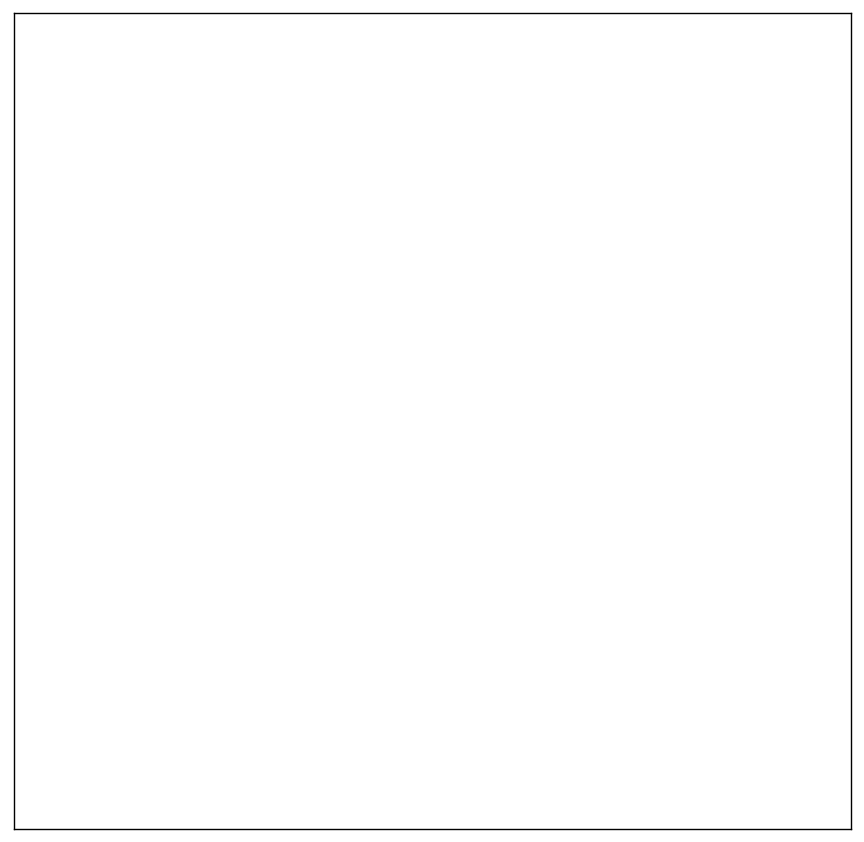

In [19]:
for _time in ['2020-12-14 02:03:49']:
    f = make_frame(pd.to_datetime(_time))

-10.952584406910885 14.108208965046106
-10.952584406910885 14.108208965046106
-10.952584406910885 14.108208965046106
-10.952584406910885 14.108208965046106
1 loop, best of 3: 3.77 s per loop


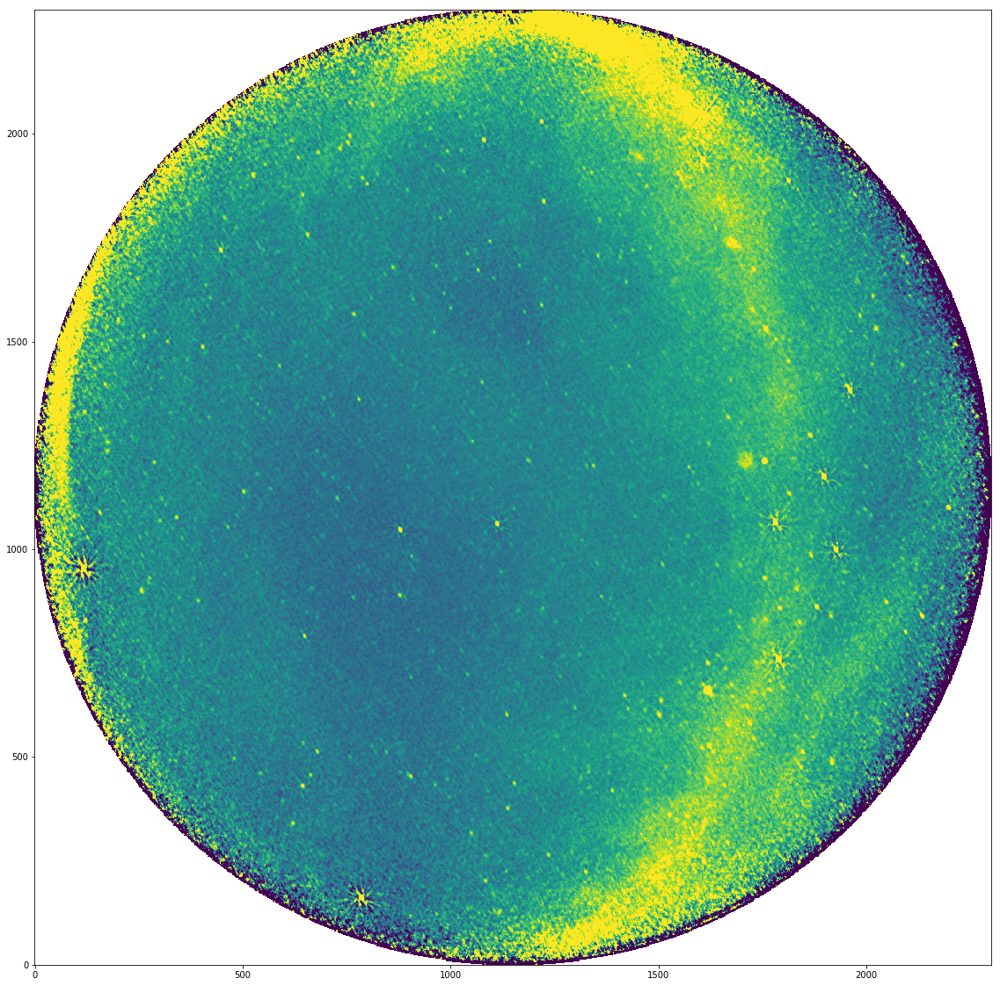

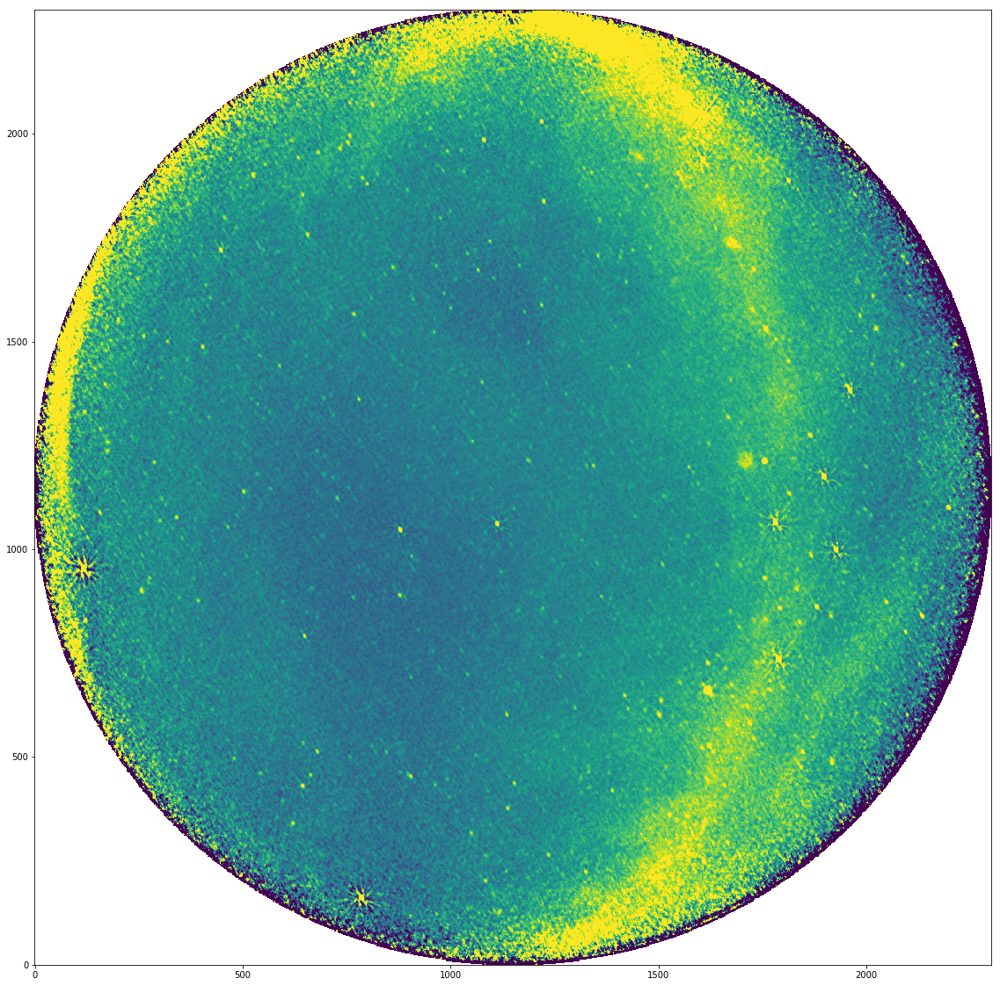

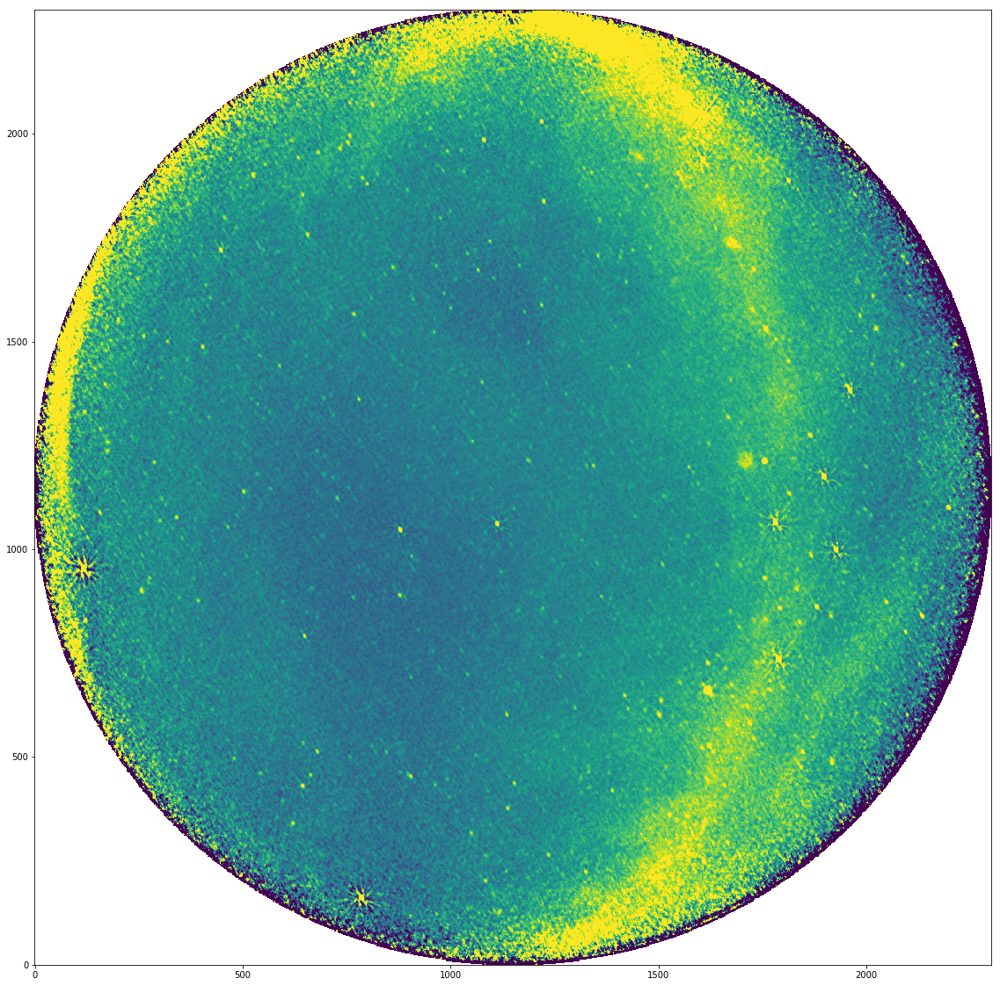

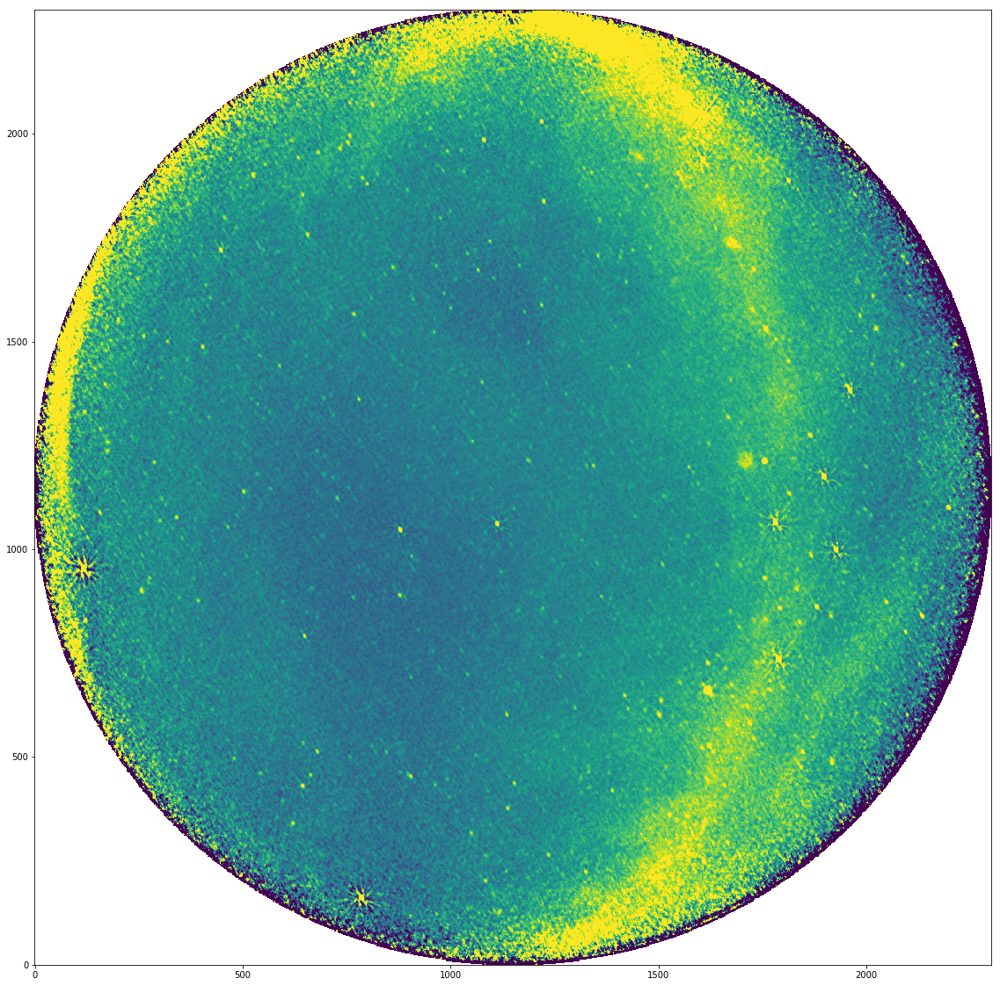

In [64]:
%%timeit
img = np.nanmedian(np.array(f), axis=0)


vmin, vmax= ZScaleInterval(contrast=0.45).get_limits(img)
print vmin,vmax

plt.figure(figsize=(20,20))
imgmap = plt.imshow(img, origin="lower",
           vmin=vmin,vmax=vmax)

In [38]:
from astropy.visualization import ZScaleInterval

44027.15119797266

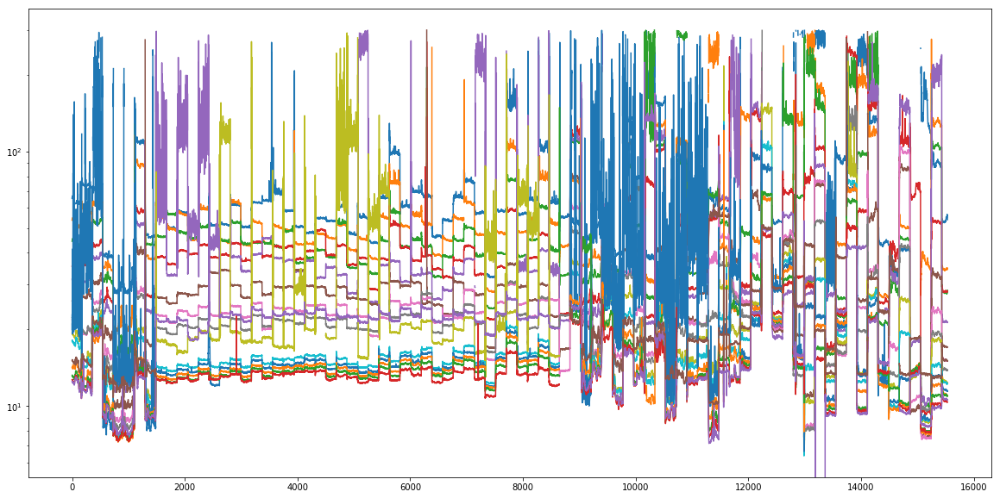

In [6]:
data = pd.read_csv("img_stds.csv")
plt.figure(figsize=(20,10))
plt.plot(data[data < 300])
plt.yscale("log")

In [43]:
data


,65.5244140625,53.92299270629883,44.54179763793945,35.52921676635742,31.491931915283203,25.917980194091797,21.91555404663086,22.169797897338867,19.330734252929688,17.996198654174805,21.748823165893555,14.318737983703613,13.237751960754395,12.734406471252441,12.530458450317383,15.13254451751709
0,65.414505,53.787052,44.412075,35.373352,31.391966,25.928272,21.887573,22.272291,19.358910,18.028446,22.844818,14.215406,13.190550,12.698992,12.512690,15.127975
1,65.941559,53.656006,44.603497,35.686104,31.707891,26.025812,21.951931,22.230669,19.379377,18.145098,19.884918,14.236903,13.232511,12.675353,12.522508,15.182051
2,65.512512,53.891113,44.544392,35.655228,31.630665,26.026844,21.919605,22.196865,19.384087,18.060780,21.120323,14.231671,13.210872,12.690859,12.541871,15.131326
3,66.115273,54.528122,44.812962,35.717419,31.727461,26.111378,22.035250,22.270397,19.435484,18.169312,20.720371,14.260086,13.247717,12.715732,12.529611,15.227232
4,66.559494,54.482265,44.841270,35.797119,31.641357,26.036289,22.006207,22.132160,19.360956,18.116796,20.016459,14.212637,13.210854,12.718898,12.514236,15.167199
5,66.830498,54.706757,44.884094,35.754730,31.717043,26.044512,22.061218,22.232014,19.278616,17.998049,19.851902,14.217148,13.175694,12.690877,12.497398,15.109660
6,66.953094,54.213669,44.888214,35.839928,31.701221,26.066088,22.013504,22.103298,19.269722,18.004513,19.194233,14.201728,13.190826,12.668911,12.504534,15.119614
7,66.791405,54.640633,45.333988,35.766994,31.727182,26.031038,21.959267,22.089302,19.172941,17.887119,33.865391,14.035659,13.081543,12.542255,12.424762,15.063862
8,66.598602,54.640491,45.377907,35.965633,31.670883,26.005190,21.890265,22.075169,19.196230,17.909079,24.454412,14.075260,13.063979,12.616853,12.358966,15.055198
9,66.858452,54.388359,45.037712,35.854927,31.702702,26.070324,21.938763,22.115448,19.261147,17.934534,21.626534,14.114148,13.113949,12.664794,12.457424,15.052598


In [26]:

loc_met = SkyCoord(295*u.deg, 10*u.deg,)
alt_az = loc_met.transform_to(AltAz(location=loc_lofar, obstime=pd.to_datetime('2020-12-13 17:07:07')))
print alt_az.alt.deg, alt_az.az.deg

30.7210808807 243.284314926


In [33]:
    line_to_radiant = SkyCoord(np.array(geod.npts(112.,
                                              32., 316, 
                                              18.6, 101)) * u.deg)
    line = wcs.wcs_world2pix(line_to_radiant.ra.deg,
                             line_to_radiant.ra.deg , 0)

NameError: name 'wcs' is not defined

In [ ]:
!mkdir /hddstore/mkuiack1/png
_out = Parallel(n_jobs=6)(delayed(make_frame)(fi_ind) for fi_ind in index)

In [ ]:
subprocess.call(["rsync", "-av", "/hddstore/mkuiack1/png", "/zfs/helios/filer0/mkuiack1/{}/png".format(OBS)])

In [ ]:
make_frame(fi_ind)

In [7]:
basedir = "/zfs/helios/filer0/mkuiack1/202012131700"
SLICE = "2020-12-13T17:31:37-17:34:47"

img_files = glob.glob(basedir+"/2020-12-13T17:31:37-17:34:47_all/SB*/cleaned/00099**.fits")
print len(img_files)

15


In [9]:
basedir = "/zfs/helios/filer0/mkuiack1/202101032100"

img_files = glob.glob(basedir+"/2021-01-03T21:05:01-21:08:11_all/SB*/imgs/2021-01-03T21:06:3*")

print len(img_files)

all_freqs = []
slice_times = []
all_std = []
count = 0 
im_stack = []

for img_file in img_files:

        try:
            data, f=fits.getdata(img_file, header=True)
        except IOError:
            print "IOError", img_file
            continue

        STD = np.std(data[0,0,:,:])
        
        slice_times.append(f["DATE-OBS"])
        all_freqs.append(f[" CRVAL3"]/1e6)

        beam_model = get_beam(f[" CRVAL3"]/1e6)

#         if STD < 80. and STD > 3.:
        im_stack.append(data[0,0,:,:]/np.abs(np.median(data[0,0,500:1500,500:1500]))*(np.max(beam_model)/beam_model))



160


/home/mkuiack1/env/lib/python2.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in divide


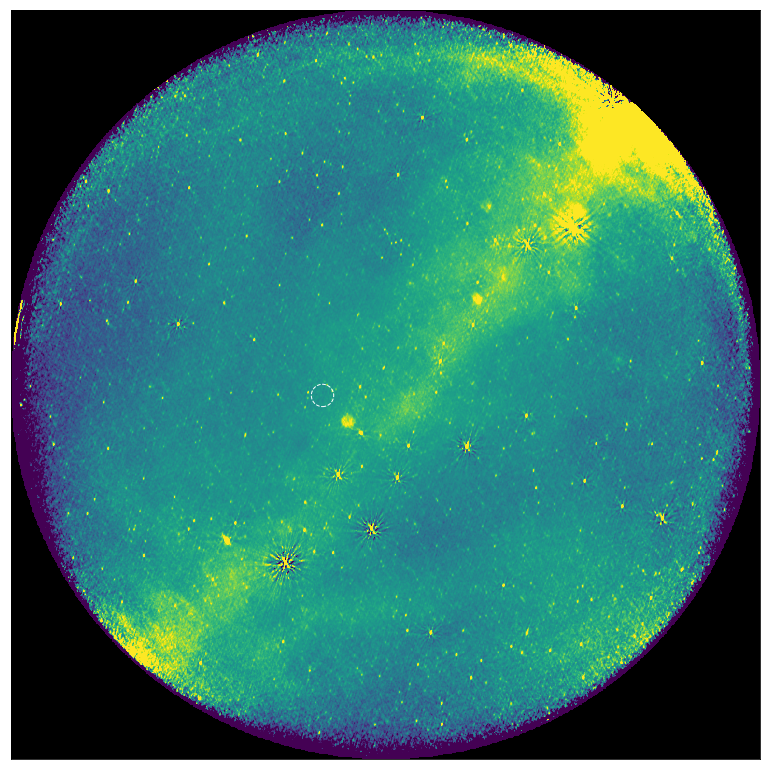

In [12]:
fig = plt.figure(figsize=(10.8, 10.8))
ax = plt.subplot(111)

img = np.median(np.array(im_stack), axis=0)

vmin, vmax = ZScaleInterval(contrast=0.4).get_limits(img)

imgmap = plt.imshow(img, origin="lower",
           vmin=vmin, vmax=vmax)

hdu = fits.open(img_file)[0]
wcs = WCS(hdu.header)
wcs = wcs.dropaxis(-1).dropaxis(-1)

spot = wcs.wcs_world2pix(82., 50., 0)
plt.scatter(np.array(spot)[0],
     np.array(spot)[1], 500,
        facecolors='none', edgecolors='w', linestyle="dashed",
            label="Geminids")


imgmap.cmap.set_bad('k',1.)
ax.patch.set_facecolor('k')

plt.xticks([])
plt.yticks([])
plt.tight_layout()

In [15]:
basedir = "/zfs/helios/filer0/mkuiack1/202012131700"
SLICE = "2020-12-13T17:31:37-17:34:47"

img_files2 = glob.glob(basedir+"/"+SLICE +"_all/SB*/cleaned/0000[0..9]*.fits")
print len(img_files2)

im_stack2 = []

for img_file2 in img_files2:

        try:
            data, f2 =fits.getdata(img_file2, header=True)
        except IOError:
            print "IOError", img_file2
            continue



        beam_model = get_beam(f2[" CRVAL3"]/1e6)

#         if STD < 80. and STD > 3.:
        im_stack2.append(data[0,0,:,:]/np.abs(np.median(data[0,0,500:1500,500:1500]))*(np.max(beam_model)/beam_model))



30


/home/mkuiack1/env/lib/python2.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: divide by zero encountered in divide


/home/mkuiack1/env/lib/python2.7/site-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in subtract
/home/mkuiack1/env/lib/python2.7/site-packages/ipykernel_launcher.py:48: RuntimeWarning: invalid value encountered in subtract


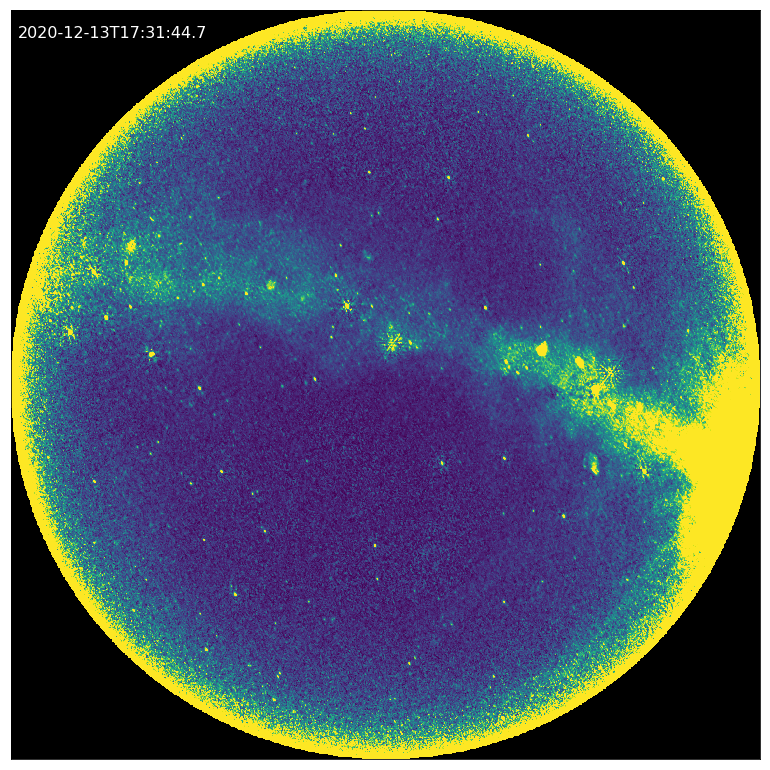

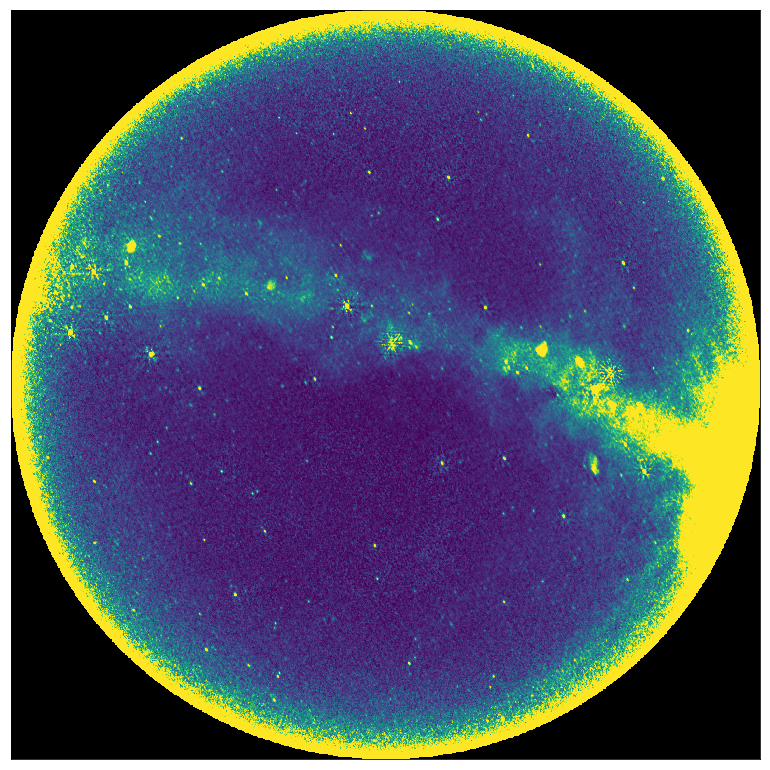

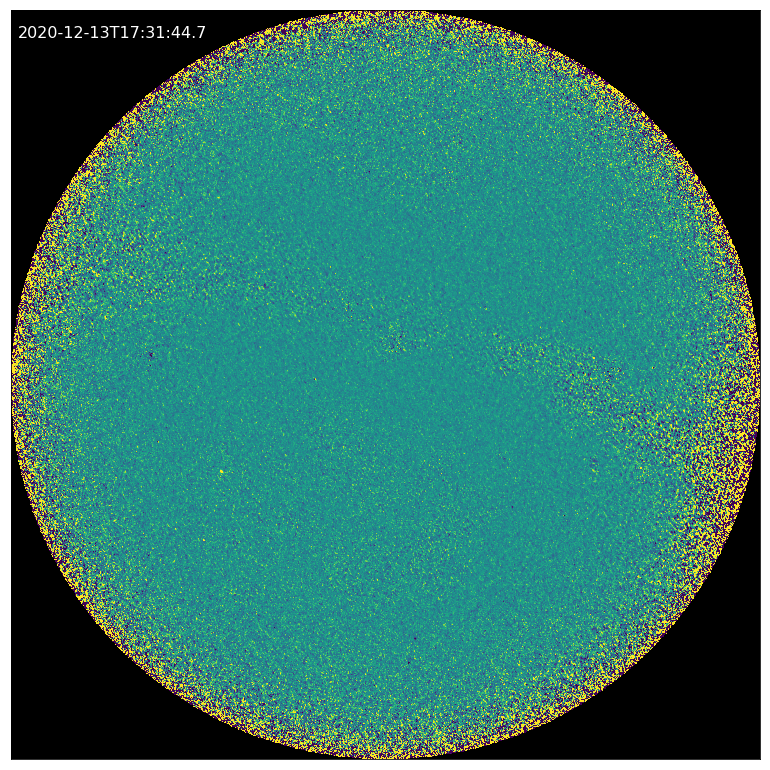

In [16]:
fig = plt.figure(figsize=(10.8, 10.8))
ax = plt.subplot(111)

img = np.median(np.abs(np.array(im_stack)), axis=0)

vmin, vmax = ZScaleInterval(contrast=0.4).get_limits(img)

imgmap = plt.imshow(img, origin="lower",
           vmin=vmin, vmax=vmax)

plt.text(.01,.98, f["DATE-OBS"], va="top", ha="left",
             fontsize=16, color="white", transform=ax.transAxes,)

imgmap.cmap.set_bad('k',1.)
ax.patch.set_facecolor('k')

plt.xticks([])
plt.yticks([])
plt.tight_layout()

##

fig = plt.figure(figsize=(10.8, 10.8))
ax = plt.subplot(111)

img = np.median(np.abs(np.array(im_stack2)), axis=0)

vmin, vmax = ZScaleInterval(contrast=0.4).get_limits(img)

imgmap = plt.imshow(img, origin="lower",
           vmin=vmin, vmax=vmax)

imgmap.cmap.set_bad('k',1.)
ax.patch.set_facecolor('k')

plt.xticks([])
plt.yticks([])
plt.tight_layout()

fig = plt.figure(figsize=(10.8, 10.8))
ax = plt.subplot(111)

img = np.median(np.abs(np.array(im_stack)), axis=0)
img2 = np.median(np.abs(np.array(im_stack2)), axis=0)

vmin, vmax = ZScaleInterval(contrast=0.4).get_limits(img-img2)

imgmap = plt.imshow(img-img2, origin="lower",
           vmin=vmin, vmax=vmax)

plt.text(.01,.98, f["DATE-OBS"], va="top", ha="left",
             fontsize=16, color="white", transform=ax.transAxes,)


imgmap.cmap.set_bad('k',1.)
ax.patch.set_facecolor('k')

plt.xticks([])
plt.yticks([])
plt.tight_layout()



In [17]:
basedir = "/zfs/helios/filer0/mkuiack1/202012131700"
SLICE = "2020-12-13T17:31:37-17:34:47"

for num in np.arange(0,190):
    
    img_files = glob.glob(basedir+"/"+SLICE +"_all/SB*/imgs/{}*['I']-image.fits".format(str(num).zfill(5) ))
    print len(img_files)

    im_stack = []

    for img_file in img_files:

            try:
                data, f=fits.getdata(img_file, header=True)
            except IOError:
                print "IOError", img_file
                continue

            beam_model = get_beam(f[" CRVAL3"]/1e6)

    #         if STD < 80. and STD > 3.:
            im_stack.append(data[0,0,:,:]/np.abs(np.median(data[0,0,500:1500,500:1500]))*(np.max(beam_model)/beam_model))


    fig = plt.figure(figsize=(10.8, 10.8))
    ax = plt.subplot(111)

    img = np.median(np.array(im_stack), axis=0)
    img2 = np.median(np.array(im_stack2), axis=0)

    vmin, vmax = ZScaleInterval(contrast=0.4).get_limits(img-img2)

    imgmap = plt.imshow(img-img2, origin="lower",
               vmin=vmin, vmax=vmax)

    plt.text(.01,.98, f["DATE-OBS"], va="top", ha="left",
                 fontsize=16, color="white", transform=ax.transAxes,)


    imgmap.cmap.set_bad('k',1.)
    ax.patch.set_facecolor('k')

    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()
    
    fig.savefig("/hddstore/mkuiack1/png/{}-Idiff.png".format(f["DATE-OBS"]), 
                dpi=100, facecolor='black')
    plt.close()
    print num

15


/home/mkuiack1/env/lib/python2.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: divide by zero encountered in divide
/home/mkuiack1/env/lib/python2.7/site-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in subtract
/home/mkuiack1/env/lib/python2.7/site-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in subtract


0
15
1
15
2
15
3
15
4
15
5
15
6
15
7
15
8
15
9
15
10
15
11
15
12
15
13
15
14
15
15
15
16
15
17
15
18
15
19
15
20
15
21
15
22
15
23
15
24
15
25
15
26
15
27
15
28
15
29
15
30
15
31
15
32
15
33
15
34
15
35
15
36
15
37
15
38
15
39
15
40
15
41
15
42
15
43
15
44
15
45
15
46
15
47
15
48
15
49
15
50
15
51
15
52
15
53
15
54
15
55
15
56
15
57
15
58
15
59
15
60
15
61
15
62
15
63
15
64
15
65
15
66
15
67
15
68
15
69
15
70
15
71
15
72
15
73
15
74
15
75
15
76
15
77
15
78
15
79
15
80
15
81
15
82
15
83
15
84
15
85
15
86
15
87
15
88
15
89
15
90
15
91
15
92
15
93
15
94
15
95
15
96
15
97
15
98
15
99
15
100
15
101
15
102
15
103
15
104
15
105
15
106
15
107
15
108
15
109
15
110
15
111
15
112
15
113
15
114
15
115
15
116
15
117
15
118
15
119
15
120
15
121
15
122
15
123
15
124
15
125
15
126
15
127
15
128
15
129
15
130
15
131
15
132
15
133
15
134
15
135
15
136
15
137
15
138
15
139
15
140
15
141
15
142
15
143
15
144
15
145
15
146
15
147
15
148
15
149
15
150
15
151
15
152
15
153
15
154
15
155
15
156
15
157
15
158


KeyboardInterrupt: 

In [ ]:
import subprocess

OBS="202012131700"
subprocess.call(["rsync", "--remove-source-files", 
                 "-av", "/hddstore/mkuiack1/png", 
                 "/zfs/helios/filer0/mkuiack1/{}".format(OBS)])

In [ ]:
#rsync --remove-source-files -av /hddstore/mkuiack1/png /zfs/helios/filer0/mkuiack1/202012131800

In [ ]:
basedir = "/zfs/helios/filer0/mkuiack1/202012131700"
SLICE = "2020-12-13T17:31:37-17:34:47"


img_files2 = glob.glob(basedir+"/"+SLICE +"_all/SB*/imgs/0000[2..7]*['U','Q']-image.fits")
print len(img_files2)

im_stack2 = []

for img_file2 in img_files2:

        try:
            data, f2 =fits.getdata(img_file2, header=True)
        except IOError:
            print "IOError", img_file2
            continue



        beam_model = get_beam(f2[" CRVAL3"]/1e6)

#         if STD < 80. and STD > 3.:
        im_stack2.append(data[0,0,:,:]/np.abs(np.median(data[0,0,500:1500,500:1500]))*(np.max(beam_model)/beam_model))





for num in np.arange(0,190):
    
    img_files = glob.glob(basedir+"/"+SLICE +"_all/SB*/imgs/{}*['U','Q']-image.fits".format(str(num).zfill(5) ))
    print len(img_files)

    im_stack = []

    for img_file in img_files:

            try:
                data, f=fits.getdata(img_file, header=True)
            except IOError:
                print "IOError", img_file
                continue

            beam_model = get_beam(f[" CRVAL3"]/1e6)

    #         if STD < 80. and STD > 3.:
            im_stack.append(data[0,0,:,:]/np.abs(np.median(data[0,0,500:1500,500:1500]))*(np.max(beam_model)/beam_model))


    fig = plt.figure(figsize=(10.8, 10.8))
    ax = plt.subplot(111)

    img = np.median(np.abs(np.array(im_stack)), axis=0)
    img2 = np.median(np.abs(np.array(im_stack2)), axis=0)

    vmin, vmax = ZScaleInterval(contrast=0.4).get_limits(img-img2)

    imgmap = plt.imshow(img-img2, origin="lower",
               vmin=vmin, vmax=vmax)

    plt.text(.01,.98, f["DATE-OBS"], va="top", ha="left",
                 fontsize=16, color="white", transform=ax.transAxes,)


    imgmap.cmap.set_bad('k',1.)
    ax.patch.set_facecolor('k')

    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()
    
    fig.savefig("/hddstore/mkuiack1/png/{}-QUdiff.png".format(f["DATE-OBS"]), 
                dpi=100, facecolor='black')
    print num
    
OBS="202012131700"
subprocess.call(["rsync", "--remove-source-files", 
                 "-av", "/hddstore/mkuiack1/png", 
                 "/zfs/helios/filer0/mkuiack1/{}".format(OBS)])

60


/home/mkuiack1/env/lib/python2.7/site-packages/ipykernel_launcher.py:23: RuntimeWarning: divide by zero encountered in divide


30


/home/mkuiack1/env/lib/python2.7/site-packages/ipykernel_launcher.py:47: RuntimeWarning: divide by zero encountered in divide
/home/mkuiack1/env/lib/python2.7/site-packages/ipykernel_launcher.py:56: RuntimeWarning: invalid value encountered in subtract
/home/mkuiack1/env/lib/python2.7/site-packages/ipykernel_launcher.py:58: RuntimeWarning: invalid value encountered in subtract


0
30
1
30
2
30
3
30
4
30
5
30
6
30
7
30
8
30
9
30
10
30
11
30
12
30
13
30
14
30
15
30
16
30
17
30
18
30
19
30
20
30
21
30
22
30
23
30
24
30
25
30
26
30
27
30
28
30
29
30
30
30
31
30
32
30
33
30
34
30
35
30
36
30
37
30
38
30
39
30
40
30
41
30
42
30
43
30
44
30
45
30
46
30
47
30
48
30
49
30
50
30
51
30
52
30
53
30
54
30
55
30
56
30
57
30
58
30
59
30
60
30
61
30
62
30
63
30
64
30
65
30
66
30
67
30
68
30
69
30
70
30
71
30
72
30
73
30
74
30
75
30
76
30
77
30
78
30
79
30
80
30
81
30
82
30
83
30
84
30
85
30
86
30
87
30
88
30
89
30
90
30
91
30
92
30
93
30
94
30
95
30
96
30
97
30
98
30
99
30
100
30
101
30
102
30
103
30
104
30
105
30
106
30
107
30
108
30
109
30
110
30
111
30
112
30
113
30
114
30
115
30
116
30
117
30
118
30
119
30
120
30
121
30
122
30
123
30
124
30
125
30
126
30
127
30
128
30
129
30
130
30
131
30
132
30
133
30
134
30
135
30
136
30
137
30
138
30
139
30
140
30
141
30
142
30
143
30
144
30
145
30
146
30
147
30
148
30
149
30
150
30
151
30
152
30
153
30
154
30
